# Navier Stokes Solver
### 1 Spatial Dimensional solution

In [ ]:
import numpy as np                     
from matplotlib import pyplot      
import time, sys
import matplotlib.animation as animation
%matplotlib inline

In [ ]:
L = 5.0
N_x = 100
dx = L / (N_x-1)
T = 0.5
N_t = 100
dt = T / N_t
c = 1      # wave speed
print(dt)

0.005


In [ ]:
x_vector = np.linspace(0, L, N_x)
t_vector = np.linspace(0, T, N_t)
u = np.zeros((N_t, N_x))


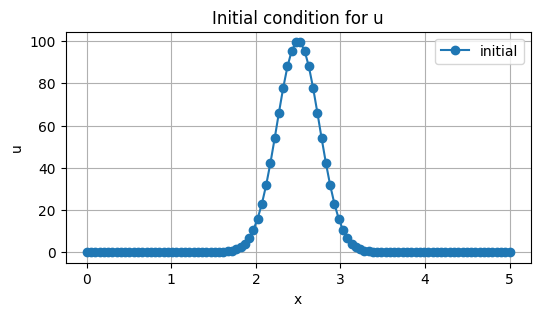

In [ ]:
# Initial condition: Gaussian bump in the center
x_vector = np.linspace(0, L, N_x)

def initial_profile(x):
    amp = 100.0
    sigma = 0.05 * L
    return amp * np.exp(-((x - L/2)**2) / (2 * sigma**2))

u[0, :] = initial_profile(x_vector)

pyplot.figure(figsize=(6,3))
pyplot.plot(x_vector, u[0, :], '-o', label='initial')
pyplot.xlabel('x')
pyplot.ylabel('u')
pyplot.title('Initial condition for u')
pyplot.legend()
pyplot.grid(True)
pyplot.show()

In [ ]:
for t in range(0, N_t - 1):
    # vectorized update for inner nodes
    u[t+1, 1:-1] = (u[t, 1:-1] - c * dt / (2 * dx) * (u[t, 2:] - u[t, :-2]))

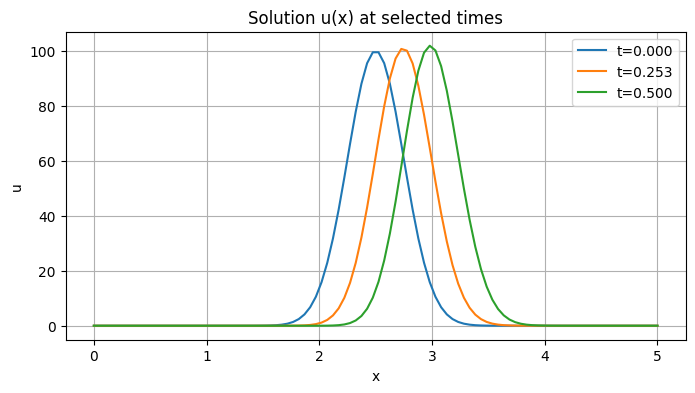

In [ ]:
pyplot.figure(figsize=(8,4))
pyplot.plot(x_vector, u[0, :], label=f't={t_vector[0]:.3f}')

if N_t > 2:
    mid_idx = N_t // 2
    pyplot.plot(x_vector, u[mid_idx, :], label=f't={t_vector[mid_idx]:.3f}')

pyplot.plot(x_vector, u[-1, :], label=f't={t_vector[-1]:.3f}')
pyplot.xlabel('x')
pyplot.ylabel('u')
pyplot.title('Solution u(x) at selected times')
pyplot.legend()
pyplot.grid(True)
pyplot.show()

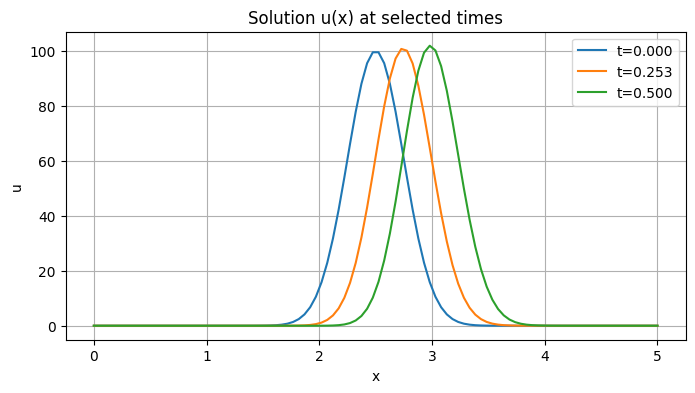

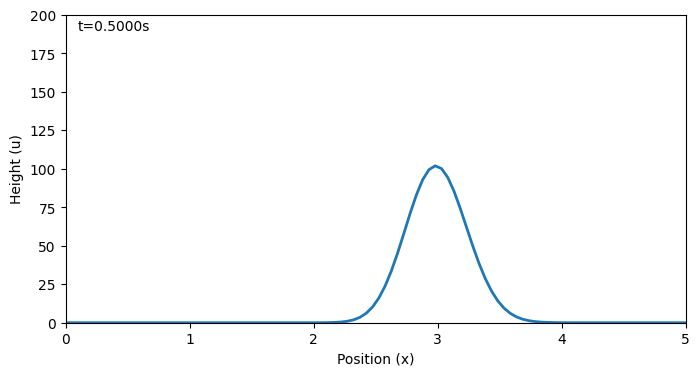

In [ ]:
pyplot.figure(figsize=(8,4))

pyplot.plot(x_vector, u[0, :], label=f't={t_vector[0]:.3f}')
if N_t > 2:
    mid_idx = N_t // 2
    pyplot.plot(x_vector, u[mid_idx, :], label=f't={t_vector[mid_idx]:.3f}')
pyplot.plot(x_vector, u[-1, :], label=f't={t_vector[-1]:.3f}')
pyplot.xlabel('x')
pyplot.ylabel('u')
pyplot.title('Solution u(x) at selected times')
pyplot.legend()
pyplot.grid(True)
pyplot.show()

from IPython.display import HTML, display
fig, ax = plt.subplots(figsize=(8, 4))
line, = ax.plot(x_vector, u[0, :], lw=2)
ax.set_xlim(0, L)
ax.set_ylim(0, 200)
ax.set_xlabel('Position (x)')
ax.set_ylabel('Height (u)')
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

max_frames = 200
step = max(1, N_t // max_frames)
frames = list(range(0, N_t, step))

def init():
    line.set_ydata(u[0, :])
    time_text.set_text('t=0.000')
    return (line, time_text) 

def animate_frame(i):
    line.set_ydata(u[i, :])
    time_text.set_text(f't={t_vector[i]:.4f}s')
    return (line, time_text)

anim = animation.FuncAnimation(fig, animate_frame, init_func=init, frames=frames, blit=True, interval=50)

try:
    display(HTML(anim.to_jshtml()))
except Exception:
    display(HTML(anim.to_html5_video()))

In [125]:
def compute_cfl(max_speed, dt, dx):
    """1D CFL number for advection: max_speed * dt / dx"""
    return abs(max_speed) * dt / dx

def compute_diffusive_dt(dx, nu, dim=1, factor=1.0):
    """Return stable explicit diffusion dt bound (1D or 2D; conservative).
    - dim=1: dt <= dx^2 / (2*nu)
    - dim=2: dt <= dx^2 / (4*nu)  (if dx=dy)
    factor is safety factor (e.g. 0.5).
    """
    if nu == 0:
        return np.inf
    if dim == 1:
        dt_max = dx**2 / (2.0 * nu)
    else:
        dt_max = dx**2 / (4.0 * nu)
    return factor * dt_max

def ensure_cfl_for_advection(u, dt, dx, c=None, cfl_max=0.9):
    """Return a dt that satisfies the CFL advective constraint.
    - If c provided, uses that.
    - Otherwise uses max(|u|) from the state.
    """
    if c is not None:
        max_speed = abs(c)
    else:
        max_speed = np.max(np.abs(u))
    if max_speed == 0:
        return dt, 0.0  # no motion
    cfl = compute_cfl(max_speed, dt, dx)
    if cfl > cfl_max:
        new_dt = cfl_max * dx / max_speed
        return new_dt, cfl
    return dt, cfl

In [ ]:
L = 5.0
N_x = 1000
dx = L / (N_x - 1)
T = 1.2
N_t = 100
dt = T / N_t
c = 1.0

# compute CFL
cfl = compute_cfl(c, dt, dx)
print("Current CFL:", cfl)     # ~2.4

# adjust dt if needed
dt_safe, cfl_current = ensure_cfl_for_advection(None, dt, dx, c=c, cfl_max=0.9)
print("Adjusted dt:", dt_safe)

Current CFL: 2.3976
Adjusted dt: 0.0045045045045045045


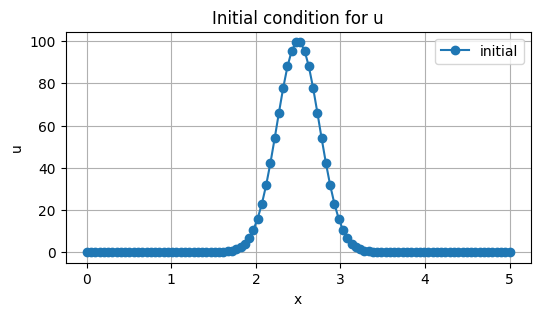

In [ ]:
x_vector = np.linspace(0, L, N_x)
t_vector = np.linspace(0, T, N_t)
u = np.zeros((N_t, N_x))
def initial_profile(x):
    amp = 100.0
    sigma = 0.05 * L
    return amp * np.exp(-((x - L/2)**2) / (2 * sigma**2))

# Set initial conditions on the wave profile
u[0, :] = initial_profile(x_vector)

pyplot.figure(figsize=(6,3))
pyplot.plot(x_vector, u[0, :], '-o', label='initial')
pyplot.xlabel('x')
pyplot.ylabel('u')
pyplot.title('Initial condition for u')
pyplot.legend()
pyplot.grid(True)
pyplot.show()


In [ ]:
# Time-stepping for non-linear convection (conservative formulation)
# run timestepping
for t in range(0, N_t - 1):
    u_t = u[t, :]
    # conservative flux for Burgers-like nonlinear convective term
    f_t = 0.5 * u_t**2

    # compute flux differences for interior points (vectorized)
    u[t+1, 1:-1] = u_t[1:-1] - (dt / dx) * (f_t[1:-1] - f_t[:-2])

    # Basic boundary conditions: Dirichlet endpoints set to zero (could be periodic if desired)
    u[t+1, 0] = 0.0
    u[t+1, -1] = 0.0

    # sanity check: if solution becomes non-finite, stop and report
    if not np.isfinite(u[t+1, :]).all():
        print(f"Numerical blowup detected at timestep {t+1}; stopping early.")
        break

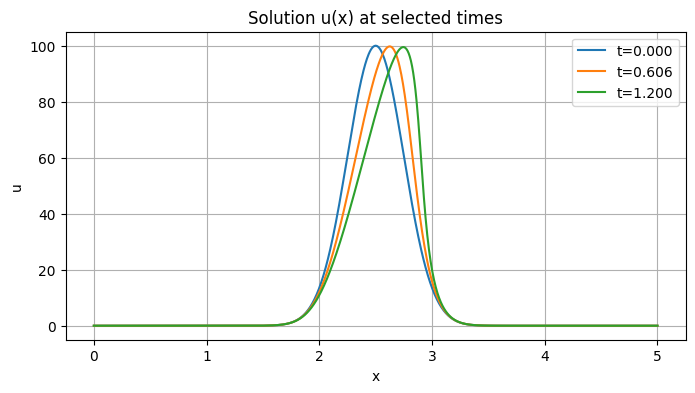

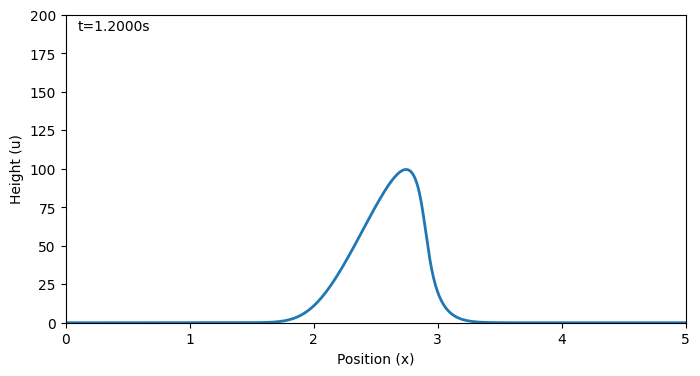

In [ ]:
pyplot.figure(figsize=(8,4))

pyplot.plot(x_vector, u[0, :], label=f't={t_vector[0]:.3f}')
if N_t > 2:
    mid_idx = N_t // 2
    pyplot.plot(x_vector, u[mid_idx, :], label=f't={t_vector[mid_idx]:.3f}')
pyplot.plot(x_vector, u[-1, :], label=f't={t_vector[-1]:.3f}')
pyplot.xlabel('x')
pyplot.ylabel('u')
pyplot.title('Solution u(x) at selected times')
pyplot.legend()
pyplot.grid(True)
pyplot.show()

from IPython.display import HTML, display
fig, ax = plt.subplots(figsize=(8, 4))
line, = ax.plot(x_vector, u[0, :], lw=2)
ax.set_xlim(0, L)
ax.set_ylim(0, 200)
ax.set_xlabel('Position (x)')
ax.set_ylabel('Height (u)')
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

max_frames = 200
step = max(1, N_t // max_frames)
frames = list(range(0, N_t, step))

def init():
    line.set_ydata(u[0, :])
    time_text.set_text('t=0.000')
    return (line, time_text) 

def animate_frame(i):
    line.set_ydata(u[i, :])
    time_text.set_text(f't={t_vector[i]:.4f}s')
    return (line, time_text)

anim = animation.FuncAnimation(fig, animate_frame, init_func=init, frames=frames, blit=True, interval=50)

try:
    display(HTML(anim.to_jshtml()))
except Exception:
    display(HTML(anim.to_html5_video()))

### 2 Spatial Dimensional Solution
#### linear convection

In [ ]:
Lx = 15.0
Ly = 15.0
T = 5.0
N_x = 100
N_y = 100
N_t = 100
kappa = 0.01

dx = Lx / (N_x - 1)
dy = Ly / (N_y - 1)
dt = T / N_t

Initial dt: 0.05000, dx: 0.15152, dy: 0.15152


In [200]:
# defining full grid
x_vector = np.linspace(0, Lx, N_x)
y_vector = np.linspace(0, Ly, N_y)
t_vector = np.linspace(0, T, N_t)
# definining a full grid to contain results
u = np.zeros((N_t, N_x, N_y))

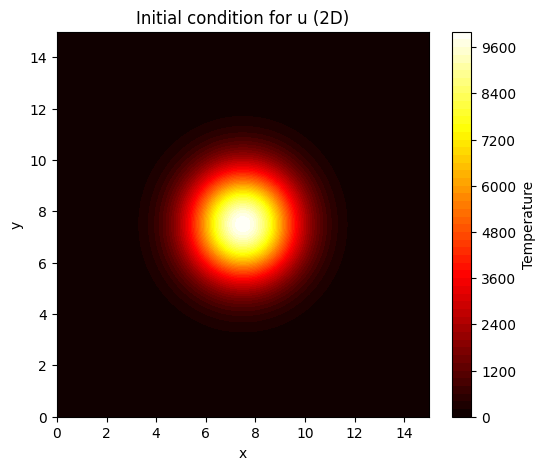

In [ ]:
def initial_profile_2d(x, y):
    amp = 10000.0
    sigma = 0.1 * Lx
    return amp * np.exp(-((x - Lx/2)**2 + (y - Ly/2)**2) / (2 * sigma**2))

X, Y = np.meshgrid(x_vector, y_vector, indexing='ij')
u[0, :, :] = initial_profile_2d(X, Y)

pyplot.figure(figsize=(6,5))
pyplot.contourf(X, Y, u[0, :, :], levels=50, cmap='hot')
pyplot.colorbar(label='Temperature')
pyplot.xlabel('x')
pyplot.ylabel('y')
pyplot.title('Initial condition for u (2D)')
pyplot.show()

In [ ]:
# Boundary conditions: Dirichlet u=0 on all edges
u[:, 0, :] = 0.0
u[:, -1, :] = 0.0
u[:, :, 0] = 0.0
u[:, :, -1] = 0.0

In [ ]:
for t in range(0, N_t - 1):
    # Compute first derivatives using central differences
    u_x = (u[t, 2:, 1:-1] - u[t, :-2, 1:-1]) / (2 * dx)
    u_y = (u[t, 1:-1, 2:] - u[t, 1:-1, :-2]) / (2 * dy)
    
     # Update the solution using the convection equation
    u[t+1, 1:-1, 1:-1] = u[t, 1:-1, 1:-1] - dt * (u_x - u_y)


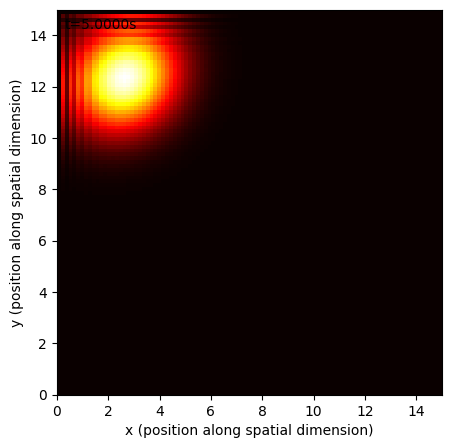

In [ ]:
from IPython.display import HTML, display
fig, ax = plt.subplots(figsize=(6, 5))
vmin = u.min()
vmax = u.max()
im = ax.imshow(u[0, :, :], origin='lower', extent=[0, Lx, 0, Ly], cmap='hot', vmin=vmin, vmax=vmax)
ax.set_xlabel('x (position along spatial dimension)')
ax.set_ylabel('y (position along spatial dimension)')
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

max_frames = 500
step = max(1, N_t // max_frames)
frames = list(range(0, N_t, step))
def init():
    im.set_array(u[0, :, :])
    time_text.set_text('t=0.000')
    return (im, time_text)
def animate_frame(i):
    im.set_array(u[i, :, :])
    time_text.set_text(f't={t_vector[i]:.4f}s')
    return (im, time_text)
anim = animation.FuncAnimation(fig, animate_frame, init_func=init, frames=frames, blit=True, interval=50)

try:
    display(HTML(anim.to_jshtml()))
except Exception:
    display(HTML(anim.to_html5_video()))

#### 2D Non-linear convection

In [ ]:
Lx = 15.0
Ly = 15.0
T = 5.0
N_x = 100
N_y = 100
N_t = 100
kappa = 0.01

dx = Lx / (N_x - 1)
dy = Ly / (N_y - 1)
dt = T / N_t

Initial dt: 0.05000, dx: 0.15152, dy: 0.15152


In [ ]:
# defining full grid
x_vector = np.linspace(0, Lx, N_x)
y_vector = np.linspace(0, Ly, N_y)
t_vector = np.linspace(0, T, N_t)
# definining a full grid to contain results
u = np.zeros((N_t, N_x, N_y))

# Boundary conditions - Dirichlet zero at edges
u[:, 0, :] = 0.0
u[:, -1, :] = 0.0
u[:, :, 0] = 0.0
u[:, :, -1] = 0.0

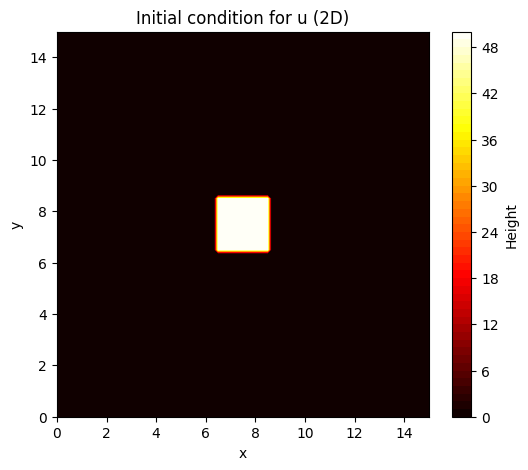

In [226]:
# square pulse initial condition
def initial_profile_2d(x, y):
    amp = 50.0
    width = 2.0  # width of square pulse
    profile = np.zeros_like(x)
    profile[(x >= (Lx - width)/2) & (x <= (Lx + width)/2) &
            (y >= (Ly - width)/2) & (y <= (Ly + width)/2)] = amp
    return profile

X, Y = np.meshgrid(x_vector, y_vector, indexing='ij')
u[0, :, :] = initial_profile_2d(X, Y)

pyplot.figure(figsize=(6,5))
pyplot.contourf(X, Y, u[0, :, :], levels=50, cmap='hot')
pyplot.colorbar(label='Height')
pyplot.xlabel('x')
pyplot.ylabel('y')
pyplot.title('Initial condition for u (2D)')
pyplot.show()

In [227]:
# 2D nonlinear convection (scalar Burgers-like, conservative form)
# Uses scalar flux f(u) = 0.5 * u^2 in both x and y directions

# CFL/adaptive dt safety factor
cfl_max = 0.5

for t in range(0, N_t - 1):
    u_curr = u[t, :, :]            # shape (N_x, N_y)
    # compute max speed and adapt dt if required
    max_speed = np.max(np.abs(u_curr))
    if max_speed == 0:
        max_speed = 1e-16
    cfl = max_speed * dt / min(dx, dy)
    if cfl > cfl_max:
        # reduce dt to keep stability (warn once)
        dt = cfl_max * min(dx, dy) / max_speed
        print(f"CFL too high at t={t}, reduced dt to {dt:.3e} (cfl was {cfl:.3f})")

    # Conservative flux f(u) = 0.5 * u^2
    f = 0.5 * u_curr**2             # shape (N_x, N_y)

    # Calculate flux differences (f_i - f_{i-1})/dx for interior cells i=1..N_x-2
    df_dx = (f[1:-1, 1:-1] - f[:-2, 1:-1]) / dx   # shape (N_x-2, N_y-2)
    df_dy = (f[1:-1, 1:-1] - f[1:-1, :-2]) / dy   # shape (N_x-2, N_y-2)

    # Update interior using conservative update
    u[t+1, 1:-1, 1:-1] = u_curr[1:-1, 1:-1] - dt * (df_dx + df_dy)

    # sanity check to stop early if values explode or become non-finite
    if not np.isfinite(u[t+1, :, :]).all():
        print(f"Blowup detected at timestep {t+1}; stopping simulation early.")
        break

# Note: A Rusanov (local Lax-Friedrichs) or upwind flux may be required for sharper, more stable solutions.

CFL too high at t=0, reduced dt to 1.515e-03 (cfl was 16.500)


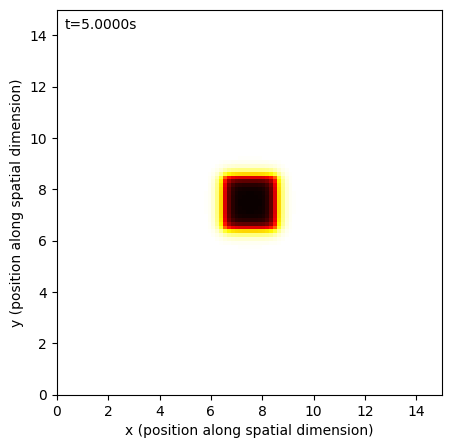

In [ ]:
from IPython.display import HTML, display
fig, ax = plt.subplots(figsize=(6, 5))
vmin = u.min()
vmax = u.max()
im = ax.imshow(u[0, :, :], origin='lower', extent=[0, Lx, 0, Ly], cmap='hot', vmin=vmin, vmax=vmax)
ax.set_xlabel('x (position along spatial dimension)')
ax.set_ylabel('y (position along spatial dimension)')
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

max_frames = 500
step = max(1, N_t // max_frames)
frames = list(range(0, N_t, step))
def init():
    im.set_array(u[0, :, :])
    time_text.set_text('t=0.000')
    return (im, time_text)
def animate_frame(i):
    im.set_array(u[i, :, :])
    time_text.set_text(f't={t_vector[i]:.4f}s')
    return (im, time_text)
anim = animation.FuncAnimation(fig, animate_frame, init_func=init, frames=frames, blit=True, interval=50)

try:
    display(HTML(anim.to_jshtml()))
except Exception:
    display(HTML(anim.to_html5_video()))

#### Laplace's equation in 2D

Initial dt: 0.05000, dx: 0.15152, dy: 0.15152


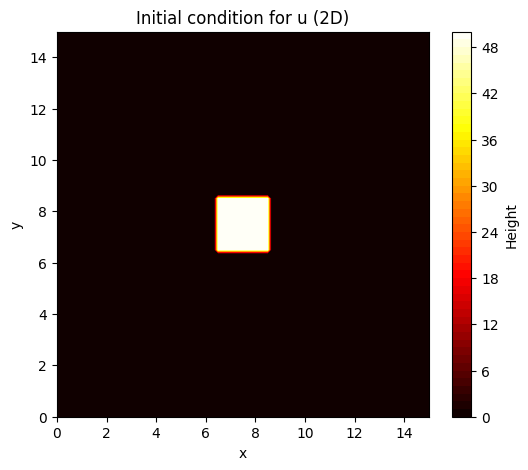

In [ ]:

Lx = 15.0
Ly = 15.0
T = 5.0
N_x = 100
N_y = 100
N_t = 100
kappa = 0.01

dx = Lx / (N_x - 1)
dy = Ly / (N_y - 1)
dt = T / N_t
print(f"Initial dt: {dt:.5f}, dx: {dx:.5f}, dy: {dy:.5f}")

# defining full grid
x_vector = np.linspace(0, Lx, N_x)
y_vector = np.linspace(0, Ly, N_y)
t_vector = np.linspace(0, T, N_t)
# definining a full grid to contain results
u = np.zeros((N_t, N_x, N_y))

# Boundary conditions - Dirichlet zero at edges
u[:, 0, :] = 0.0
u[:, -1, :] = 0.0
u[:, :, 0] = 0.0
u[:, :, -1] = 0.0

# square pulse initial condition
def initial_profile_2d(x, y):
    amp = 50.0
    width = 2.0  # width of square pulse
    profile = np.zeros_like(x)
    profile[(x >= (Lx - width)/2) & (x <= (Lx + width)/2) &
            (y >= (Ly - width)/2) & (y <= (Ly + width)/2)] = amp
    return profile

X, Y = np.meshgrid(x_vector, y_vector, indexing='ij')
u[0, :, :] = initial_profile_2d(X, Y)

pyplot.figure(figsize=(6,5))
pyplot.contourf(X, Y, u[0, :, :], levels=50, cmap='hot')
pyplot.colorbar(label='Height')
pyplot.xlabel('x')
pyplot.ylabel('y')
pyplot.title('Initial condition for u (2D)')
pyplot.show()


In [ ]:
# Discretized Laplacian for 2D diffusion
def laplacian_2d(u_slice, dx, dy):
    """Compute the 2D Laplacian of u_slice using central differences."""
    lap = np.zeros_like(u_slice)
    lap[1:-1, 1:-1] = (
        (u_slice[2:, 1:-1] - 2 * u_slice[1:-1, 1:-1] + u_slice[:-2, 1:-1]) / dx**2 +
        (u_slice[1:-1, 2:] - 2 * u_slice[1:-1, 1:-1] + u_slice[1:-1, :-2]) / dy**2
    )
    return lap
# Time-stepping loop for 2D Diffusion equation
for t in range(0, N_t - 1):
    u_curr = u[t, :, :] # shape (N_x, N_y)
    lap_u = laplacian_2d(u_curr, dx, dy)
    u[t+1, 1:-1, 1:-1] = u_curr[1:-1, 1:-1] + kappa * dt * lap_u[1:-1, 1:-1]
    # sanity check to stop early if values explode or become non-finite
    if not np.isfinite(u[t+1, :, :]).all():
        print(f"Blowup detected at timestep {t+1}; stopping simulation early.")
        break

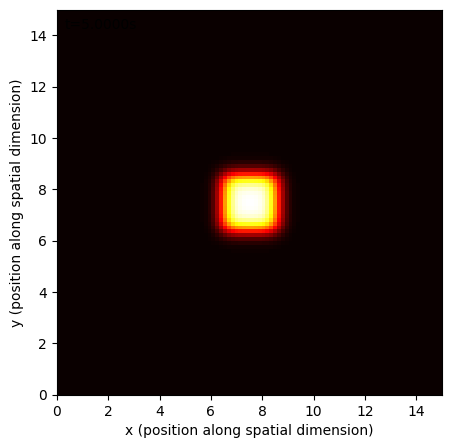

In [ ]:
from IPython.display import HTML, display
fig, ax = plt.subplots(figsize=(6, 5))
vmin = u.min()
vmax = u.max()
im = ax.imshow(u[0, :, :], origin='lower', extent=[0, Lx, 0, Ly], cmap='hot', vmin=vmin, vmax=vmax)
ax.set_xlabel('x (position along spatial dimension)')
ax.set_ylabel('y (position along spatial dimension)')
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

max_frames = 500
step = max(1, N_t // max_frames)
frames = list(range(0, N_t, step))
def init():
    im.set_array(u[0, :, :])
    time_text.set_text('t=0.000')
    return (im, time_text)
def animate_frame(i):
    im.set_array(u[i, :, :])
    time_text.set_text(f't={t_vector[i]:.4f}s')
    return (im, time_text)
anim = animation.FuncAnimation(fig, animate_frame, init_func=init, frames=frames, blit=True, interval=50)

try:
    display(HTML(anim.to_jshtml()))
except Exception:
    display(HTML(anim.to_html5_video()))

#### 2D Poisson Diffusion Equation

In [ ]:
Lx = 15.0
Ly = 15.0
T = 5.0
N_x = 100
N_y = 100
N_t = 100
kappa = 0.01

dx = Lx / (N_x - 1)
dy = Ly / (N_y - 1)
dt = T / N_t

# defining full grid
x_vector = np.linspace(0, Lx, N_x)
y_vector = np.linspace(0, Ly, N_y)
t_vector = np.linspace(0, T, N_t)
# definining a full grid to contain results
u = np.zeros((N_t, N_x, N_y))

# Boundary conditions - Dirichlet zero at edges
u[:, 0, :] = 0.0
u[:, -1, :] = 0.0
u[:, :, 0] = 0.0
u[:, :, -1] = 0.0

Initial dt: 0.05000, dx: 0.15152, dy: 0.15152


In [ ]:
def poisson_solve(u_slice, dx, dy):
    """Compute the 2D Laplacian of u_slice using central differences."""
    b = np.zeros_like(u_slice)
    b[:, :] = initial_profile_2d(X, Y)

    p = np.zeros_like(u_slice)
    p[1:-1, 1:-1] = (
        (u_slice[2:, 1:-1] - 2 * u_slice[1:-1, 1:-1] + u_slice[:-2, 1:-1]) / dx**2 +
        (u_slice[1:-1, 2:] - 2 * u_slice[1:-1, 1:-1] + u_slice[1:-1, :-2]) / dy**2 - b[1:-1, 1:-1]
    )
    return p

# Time-stepping loop for 2D Diffusion equation
for t in range(0, N_t - 1):
    u_curr = u[t, :, :]
    p = poisson_solve(u_curr, dx, dy)
    u[t+1, 1:-1, 1:-1] = u_curr[1:-1, 1:-1] + kappa * dt * p[1:-1, 1:-1]
    # sanity check to stop early if values explode or become non-finite
    if not np.isfinite(u[t+1, :, :]).all():
        print(f"Blowup detected at timestep {t+1}; stopping simulation early.")
        break


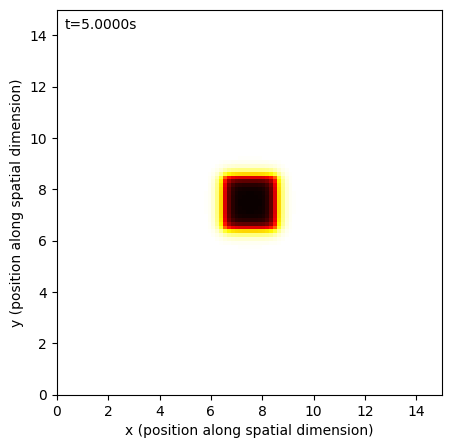

In [ ]:
from IPython.display import HTML, display
fig, ax = plt.subplots(figsize=(6, 5))
vmin = u.min()
vmax = u.max()
im = ax.imshow(u[0, :, :], origin='lower', extent=[0, Lx, 0, Ly], cmap='hot', vmin=vmin, vmax=vmax)
ax.set_xlabel('x (position along spatial dimension)')
ax.set_ylabel('y (position along spatial dimension)')
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

max_frames = 500
step = max(1, N_t // max_frames)
frames = list(range(0, N_t, step))
def init():
    im.set_array(u[0, :, :])
    time_text.set_text('t=0.000')
    return (im, time_text)
def animate_frame(i):
    im.set_array(u[i, :, :])
    time_text.set_text(f't={t_vector[i]:.4f}s')
    return (im, time_text)
anim = animation.FuncAnimation(fig, animate_frame, init_func=init, frames=frames, blit=True, interval=50)

try:
    display(HTML(anim.to_jshtml()))
except Exception:
    display(HTML(anim.to_html5_video()))

### Navier-Stokes Solver for 2D Cavity Flow

In [ ]:
# Navier-Stokes Solver for 2D Cavity Flow
Lx = 15.0
Ly = 15.0
T = 5.0
N_x = 100
N_y = 100
N_t = 100
kappa = 0.01

dx = Lx / (N_x - 1)
dy = Ly / (N_y - 1)
dt = T / N_t

# defining full grid
x_vector = np.linspace(0, Lx, N_x)
y_vector = np.linspace(0, Ly, N_y)
t_vector = np.linspace(0, T, N_t)
# definining a full grid to contain results
u = np.zeros((N_t, N_x, N_y))

Initial dt: 0.05000, dx: 0.15152, dy: 0.15152


In [ ]:
nx = 41
ny = 41
Lx = 1.0
Ly = 1.0

dx = Lx / (nx - 1)
dy = Ly / (ny - 1)

rho = 1.0         # density
nu  = 0.1         # kinematic viscosity
U_lid = 1.0       # lid velocity

dt = 0.001        # time step
nt = 500          # number of time steps
nit = 50          # Poisson iterations per time step

u = np.zeros((ny, nx))  # velocity in x
v = np.zeros((ny, nx))  # velocity in y
p = np.zeros((ny, nx))  # pressure
b = np.zeros((ny, nx))  # RHS of Poisson eq

# build RHS for pressure Poisson equation
def build_b(b, rho, dt, u, v, dx, dy):
    """
    Build the RHS b of the Poisson equation:
        ∇²p = b
    using a standard fractional-step formulation.
    """
    b[1:-1, 1:-1] = (
        rho * (
            1.0/dt * (
                (u[1:-1, 2:] - u[1:-1, :-2]) / (2.0 * dx) +
                (v[2:, 1:-1] - v[:-2, 1:-1]) / (2.0 * dy)
            )
            - ((u[1:-1, 2:] - u[1:-1, :-2]) / (2.0 * dx))**2
            - 2.0 * (
                (u[2:, 1:-1] - u[:-2, 1:-1]) / (2.0 * dy) *
                (v[1:-1, 2:] - v[1:-1, :-2]) / (2.0 * dx)
            )
            - ((v[2:, 1:-1] - v[:-2, 1:-1]) / (2.0 * dy))**2
        )
    )

    # Neumann BC for b (zero at boundaries)
    b[0, :]  = b[1, :]
    b[-1, :] = b[-2, :]
    b[:, 0]  = b[:, 1]
    b[:, -1] = b[:, -2]
    return b

# solve pressure Poisson equation iteratively
def pressure_poisson(p, b, dx, dy, nit):
    """
    Iteratively solve ∇²p = b using Jacobi-like iterations.
    """
    for _ in range(nit):
        pn = p.copy()
        p[1:-1, 1:-1] = (
            ( (pn[1:-1, 2:] + pn[1:-1, :-2]) * dy**2 +
              (pn[2:, 1:-1] + pn[:-2, 1:-1]) * dx**2
              - b[1:-1, 1:-1] * dx**2 * dy**2 )
            / (2.0 * (dx**2 + dy**2))
        )

        # Pressure boundary conditions:
        # dp/dx = 0 at left/right
        p[:, -1] = p[:, -2]   # right
        p[:, 0]  = p[:, 1]    # left
        p[0, :]  = p[1, :]    # bottom dp/dy = 0
        p[-1, :] = 0.0        # top: set reference pressure

    return p

for n in range(nt):
    un = u.copy()
    vn = v.copy()

    # Build RHS for Poisson
    b = build_b(b, rho, dt, un, vn, dx, dy)

    # Solve for pressure
    p = pressure_poisson(p, b, dx, dy, nit)

    # Update velocities (explicit in time, central in space)
    u[1:-1, 1:-1] = (
        un[1:-1, 1:-1]
        - dt * un[1:-1, 1:-1] * (un[1:-1, 2:] - un[1:-1, :-2]) / (2.0 * dx)
        - dt * vn[1:-1, 1:-1] * (un[2:, 1:-1] - un[:-2, 1:-1]) / (2.0 * dy)
        - dt / (2.0 * rho * dx) * (p[1:-1, 2:] - p[1:-1, :-2])
        + nu * dt * (
            (un[1:-1, 2:] - 2.0 * un[1:-1, 1:-1] + un[1:-1, :-2]) / dx**2 +
            (un[2:, 1:-1] - 2.0 * un[1:-1, 1:-1] + un[:-2, 1:-1]) / dy**2
        )
    )

    v[1:-1, 1:-1] = (
        vn[1:-1, 1:-1]
        - dt * un[1:-1, 1:-1] * (vn[1:-1, 2:] - vn[1:-1, :-2]) / (2.0 * dx)
        - dt * vn[1:-1, 1:-1] * (vn[2:, 1:-1] - vn[:-2, 1:-1]) / (2.0 * dy)
        - dt / (2.0 * rho * dy) * (p[2:, 1:-1] - p[:-2, 1:-1])
        + nu * dt * (
            (vn[1:-1, 2:] - 2.0 * vn[1:-1, 1:-1] + vn[1:-1, :-2]) / dx**2 +
            (vn[2:, 1:-1] - 2.0 * vn[1:-1, 1:-1] + vn[:-2, 1:-1]) / dy**2
        )
    )

    # Velocity BCs: no-slip on all walls, moving lid at top
    # bottom wall (y=0)
    u[0, :] = 0.0
    v[0, :] = 0.0

    # top wall (y=Ly)
    u[-1, :] = U_lid
    v[-1, :] = 0.0

    # left wall (x=0)
    u[:, 0] = 0.0
    v[:, 0] = 0.0

    # right wall (x=Lx)
    u[:, -1] = 0.0
    v[:, -1] = 0.0

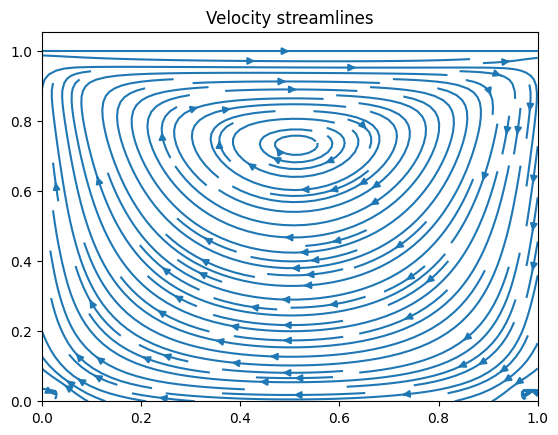

In [9]:
x = np.linspace(0, Lx, nx)
y = np.linspace(0, Ly, ny)
X, Y = np.meshgrid(x, y)
"""
plt.figure()
plt.contourf(X, Y, p, levels=50)
plt.colorbar(label="Pressure")
"""
pyplot.figure()
pyplot.streamplot(X, Y, u, v, density=1.5)
pyplot.title("Velocity streamlines")
pyplot.show()

#### Navier Stokes for 2D Channel flow

In [ ]:
nx = 81
ny = 81
Lx = 2.0
Ly = 1.0

dx = Lx / (nx - 1)
dy = Ly / (ny - 1)

rho = 1.0        # density
nu  = 0.01       # kinematic viscosity
Fx  = 1.0        # body force in x (driving the flow)

dt  = 0.001
nt  = 2000
nit = 50
# Poisson iterations per time step

# fields
u = np.zeros((ny, nx))  # x-velocity
v = np.zeros((ny, nx))  # y-velocity
p = np.zeros((ny, nx))  # pressure
b = np.zeros((ny, nx))  # RHS of Poisson eq

# build RHS of pressure Poisson with periodic x
def build_b_periodic(b, rho, dt, u, v, dx, dy):
    """
    Build RHS b for the Poisson equation ∇²p = b
    using central differences with periodicity in x.
    """
    # central differences (periodic in x via np.roll)
    du_dx = (np.roll(u, -1, axis=1) - np.roll(u, 1, axis=1)) / (2.0 * dx)
    dv_dy = (np.roll(v, -1, axis=0) - np.roll(v, 1, axis=0)) / (2.0 * dy)
    du_dy = (np.roll(u, -1, axis=0) - np.roll(u, 1, axis=0)) / (2.0 * dy)
    dv_dx = (np.roll(v, -1, axis=1) - np.roll(v, 1, axis=1)) / (2.0 * dx)

    term1 = (du_dx + dv_dy) / dt
    term2 = du_dx**2 + 2.0 * du_dy * dv_dx + dv_dy**2

    b[:, :] = rho * (term1 - term2)

    # make b consistent at solid walls in y (copy from interior)
    b[0, :]  = b[1, :]
    b[-1, :] = b[-2, :]
    return b

# solve Poisson equation ∇²p = b with periodic x, walls in y
def pressure_poisson_periodic(p, b, dx, dy, nit):
    for _ in range(nit):
        pn = p.copy()

        # Jacobi update with periodic neighbors in x via roll
        p = (
            (
                (np.roll(pn, -1, axis=1) + np.roll(pn, 1, axis=1)) * dy**2 +
                (np.roll(pn, -1, axis=0) + np.roll(pn, 1, axis=0)) * dx**2 -
                b * dx**2 * dy**2
            )
            / (2.0 * (dx**2 + dy**2))
        )

        # Neumann in y: dp/dy = 0 at walls
        p[0, :]  = p[1, :]
        p[-1, :] = p[-2, :]

        # Fix pressure reference (avoid drift): set zero mean
        p -= p.mean()

    return p

# time stepping loop
for n in range(nt):
    un = u.copy()
    vn = v.copy()

    # Build RHS and solve for pressure
    b = build_b_periodic(b, rho, dt, un, vn, dx, dy)
    p = pressure_poisson_periodic(p, b, dx, dy, nit)

    # Velocity derivatives (periodic in x via roll)
    du_dx = (np.roll(un, -1, axis=1) - np.roll(un, 1, axis=1)) / (2.0 * dx)
    du_dy = (np.roll(un, -1, axis=0) - np.roll(un, 1, axis=0)) / (2.0 * dy)
    dv_dx = (np.roll(vn, -1, axis=1) - np.roll(vn, 1, axis=1)) / (2.0 * dx)
    dv_dy = (np.roll(vn, -1, axis=0) - np.roll(vn, 1, axis=0)) / (2.0 * dy)

    dp_dx = (np.roll(p, -1, axis=1) - np.roll(p, 1, axis=1)) / (2.0 * dx)
    dp_dy = (np.roll(p, -1, axis=0) - np.roll(p, 1, axis=0)) / (2.0 * dy)

    # Laplacians for diffusion
    lap_u = (
        (np.roll(un, -1, axis=1) - 2.0 * un + np.roll(un, 1, axis=1)) / dx**2 +
        (np.roll(un, -1, axis=0) - 2.0 * un + np.roll(un, 1, axis=0)) / dy**2
    )
    lap_v = (
        (np.roll(vn, -1, axis=1) - 2.0 * vn + np.roll(vn, 1, axis=1)) / dx**2 +
        (np.roll(vn, -1, axis=0) - 2.0 * vn + np.roll(vn, 1, axis=0)) / dy**2
    )

    # Update velocities (explicit)
    u = (
        un
        + dt * (
            -un * du_dx
            - vn * du_dy
            - (1.0 / rho) * dp_dx
            + nu * lap_u
            + Fx / rho            # constant driving force
        )
    )

    v = (
        vn
        + dt * (
            -un * dv_dx
            - vn * dv_dy
            - (1.0 / rho) * dp_dy
            + nu * lap_v
        )
    )

    # No-slip at channel walls (y=0 and y=Ly)
    u[0, :]  = 0.0
    u[-1, :] = 0.0
    v[0, :]  = 0.0
    v[-1, :] = 0.0

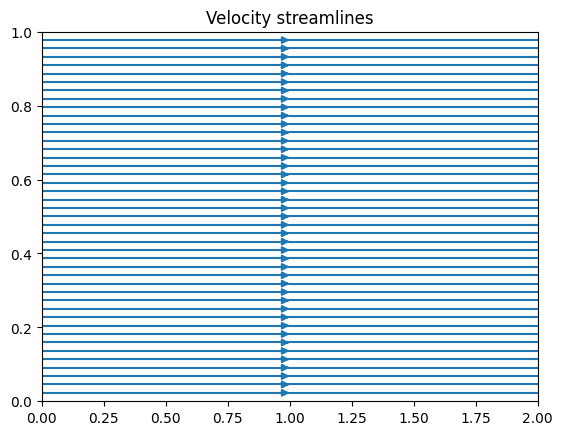

In [11]:
x = np.linspace(0, Lx, nx)
y = np.linspace(0, Ly, ny)
X, Y = np.meshgrid(x, y)
"""
plt.figure()
plt.contourf(X, Y, p, levels=50)
plt.colorbar(label="Pressure")
"""
pyplot.figure()
pyplot.streamplot(X, Y, u, v, density=1.5)
pyplot.title("Velocity streamlines")
pyplot.show()